In [16]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

# 加载图像并转换为矩阵
imgs = []
for filename in os.listdir("noise"):
    if filename.endswith(".jpg"):
        img = cv2.imread(os.path.join("noise", filename), 0)
        imgs.append(img)

In [7]:
raw_img = cv2.imread('./raw_image.jpg', 0)

In [17]:
# 计算平均图像
avg_img3 = np.mean(imgs[:3], axis=0)
avg_img5 = np.mean(imgs[:5], axis=0)
avg_img10 = np.mean(imgs[:10], axis=0)
avg_img20 = np.mean(imgs, axis=0)

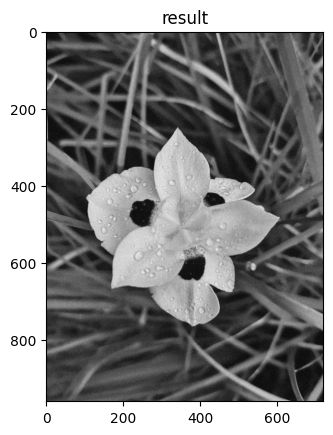

In [25]:
plt.imshow(avg_img20, cmap='gray')
plt.title("result")
plt.show()

In [13]:
# 生成高斯噪声
noise = 255 * np.random.normal(loc=0, scale=0.03, size=imgs[0].shape)
enhance = imgs[0] - noise
noise

array([[ 7.57326265e+00,  6.52592982e+00, -5.76977796e+00, ...,
         1.18060629e+00, -2.34077094e-01,  2.09999063e-01],
       [-2.87631282e+00,  2.32344495e+00,  7.42578894e+00, ...,
         2.49648242e+00, -7.33459210e-01, -1.33045599e+01],
       [ 6.88440667e+00, -7.92582579e+00, -1.04443687e+01, ...,
         7.60201978e+00, -6.16925357e+00, -1.81642126e+00],
       ...,
       [-2.60576258e+00,  6.36483161e-02, -1.23924885e+01, ...,
         5.30973988e+00,  1.68741194e-02,  1.61491719e+01],
       [-9.18178629e+00, -8.62322463e+00, -1.07010913e+01, ...,
        -5.99395556e+00,  1.56872358e+01, -2.63171668e+00],
       [-4.42968271e+00, -2.28203685e+01, -4.33812590e+00, ...,
         8.74354159e-01,  1.24786146e-01, -1.07116419e+01]])

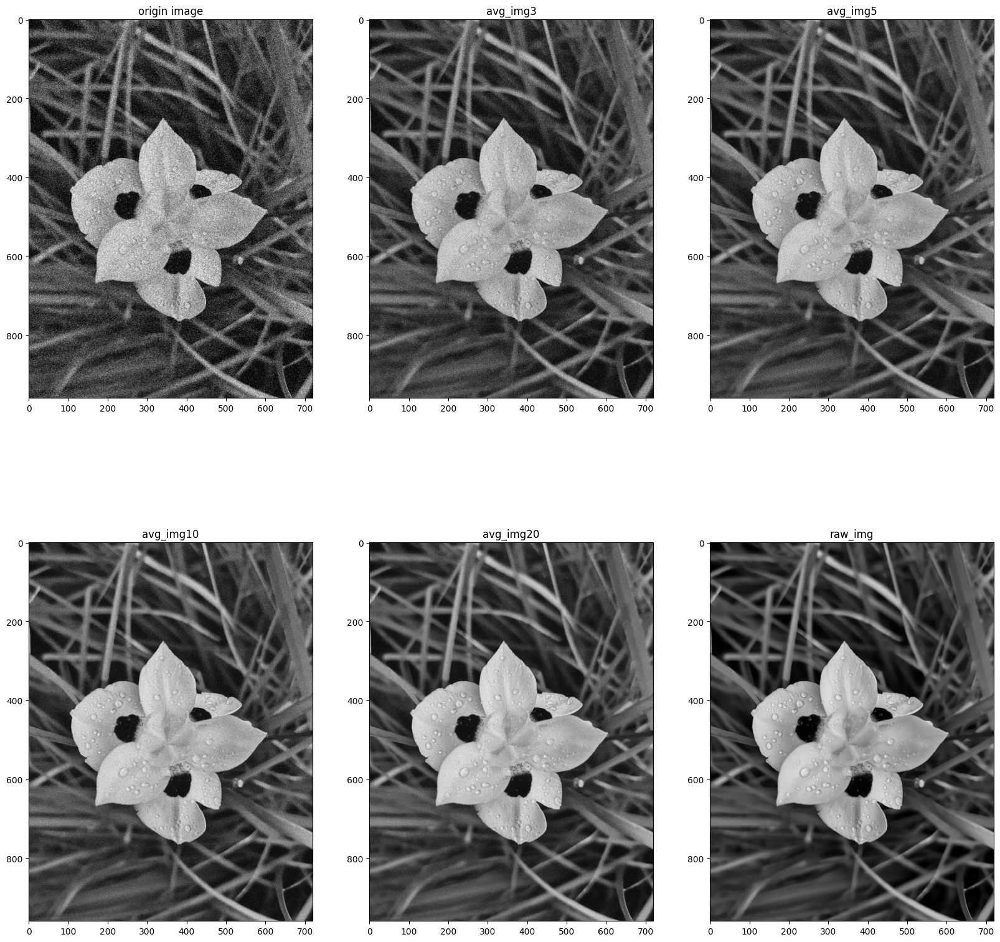

In [21]:
fig, axs = plt.subplots(2, 3, figsize=(20, 20))
axs[0, 0].imshow(imgs[0], cmap='gray')
axs[0, 0].set_title('origin image')
axs[0, 1].imshow(avg_img3, cmap='gray')
axs[0, 1].set_title('avg_img3')
axs[0, 2].imshow(avg_img5, cmap='gray')
axs[0, 2].set_title('avg_img5')
axs[1, 0].imshow(avg_img10, cmap='gray')
axs[1, 0].set_title('avg_img10')
axs[1, 1].imshow(avg_img20, cmap='gray')
axs[1, 1].set_title('avg_img20')
axs[1, 2].imshow(raw_img, cmap='gray')
axs[1, 2].set_title('raw_img')
plt.savefig('temp')
plt.show()

In [10]:
# 生成高斯噪声
noise = np.random.normal(loc=0, scale=0.03, size=imgs[0].shape)
enhance = imgs[0] - noise

In [32]:


# 修复图像
restored_imgs = []
for img in imgs:
    noisy_img = img + noise
    restored_img = avg_img - (avg_img - noisy_img)
    # restored_img = avg_img - noisy_img
    restored_imgs.append(restored_img)

# 计算平均图像
enhanced_img = np.mean(restored_imgs, axis=0)

red = enhanced_img - avg_img

In [33]:
reduce = imgs[0] - imgs[1]

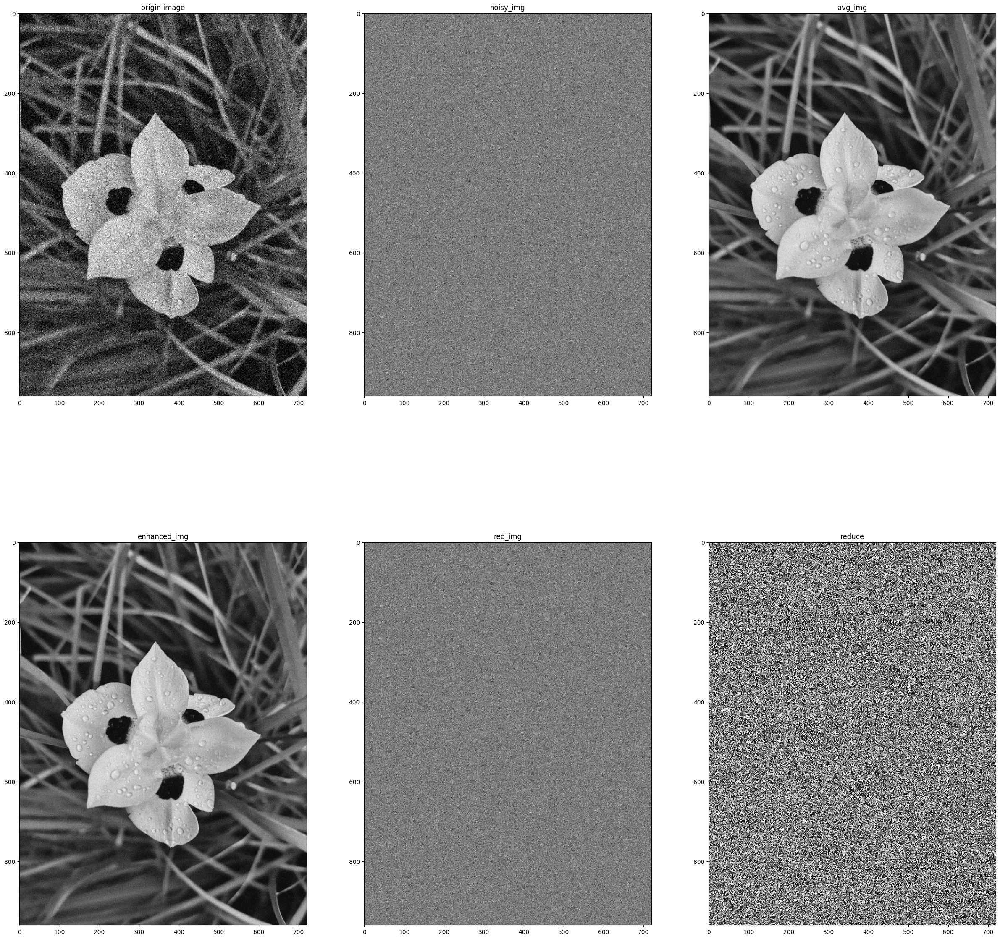

In [34]:
fig, axs = plt.subplots(2, 3, figsize=(30, 30))
axs[0, 0].imshow(imgs[0], cmap='gray')
axs[0, 0].set_title('origin image')
axs[0, 2].imshow(avg_img, cmap='gray')
axs[0, 2].set_title('avg_img')
axs[0, 1].imshow(noise, cmap='gray')
axs[0, 1].set_title('noisy_img')
axs[1, 0].imshow(enhanced_img, cmap='gray')
axs[1, 0].set_title('enhanced_img')
axs[1, 1].imshow(red, cmap='gray')
axs[1, 1].set_title('red_img')
axs[1, 2].imshow(reduce, cmap='gray')
axs[1, 2].set_title('reduce')
plt.show()

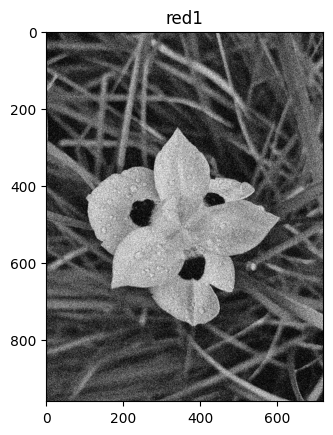

In [40]:
red1 = imgs[1] - noise
plt.imshow(red1, cmap='gray')
plt.title('red1')
plt.show()

In [35]:
# 显示最终的去噪增强图像
# cv2.imshow('Enhanced Image', enhanced_img.astype(np.uint8))
# cv2.waitKey(0)
# cv2.destroyAllWindows()